# TEST for Bark

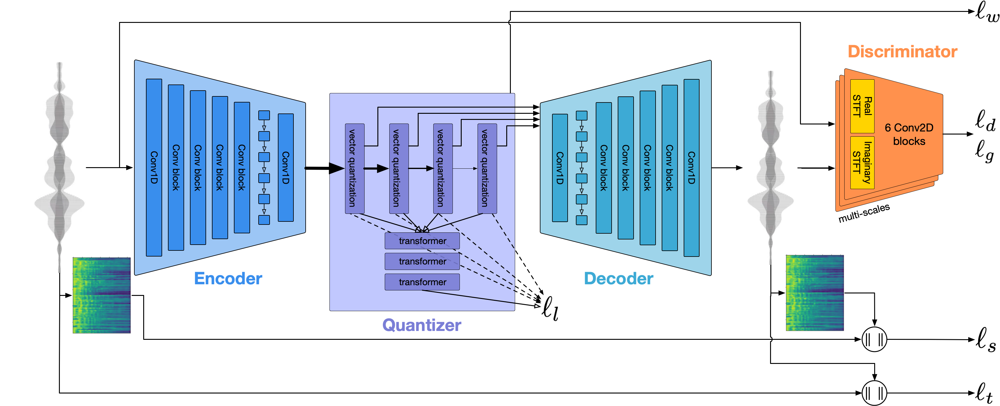

<b>Semantic model</b>
We look at Bark's semantic model, also called the text model. It is a GPT-2-like causal auto-regressive transformer model with a language modeling head on top. It takes in tokenized text (from a BERT tokenizer) as input and then predicts the semantic tokens that encode the audio to be generated.

It contains 80 million parameters and is implemented with the help of NanoGPT, a simple and blazing-fast library for setting up GPT-style models.

The output semantic tokens capture the meaning of the input text prompt and have a vocabulary size of 10,048 (i.e., the number of unique tokens the model can produce in its output).

<b>Coarse acoustics model</b>
The next model is the coarse acoustics model. It shares the same architecture as the semantic model, meaning it is a GPT-2-like causal autoregressive transformer with 80 million parameters.

It takes as input the semantic tokens from the semantic model and uses them to autoregressively predict the coarse acoustic tokens (aka token indices corresponding to the codebook) of the first two audio EnCodec codebooks.

These first two codebooks are considered coarse because they capture the coarser waveform characteristics.

<b>Fine acoustics model</b>
The final model is the fine acoustics model, a non-causal GPT-like autoencoder transformer with 80 million parameters.

It takes as input the predicted tokens for the first two codebooks generated by the coarse model and iteratively predicts the tokens of the last six codebooks based on the sum of the previous codebook embeddings.

These last six codebooks are considered fine because they capture the finer waveform characteristics.

Ultimately, we are dealing with eight codebooks in total, each with an embedding size of 1,024 (i.e., 1,024 codewords). Once the acoustic tokens have been predicted for all eight codebooks, they are input into the decoder to synthesize an output audio waveform.

The coarse and fine models aim to predict what semantic information should sound like in the domain of quantized acoustic tokens.

# Setup
Run everything in this section before any generation

**Models are located here:**
<font color='red'>\~/.cache/huggingface/hub/models--suno--bark</font>

**Voice prompts are located here**
<font color='red'>Bark/Bark_env/lib/python3.13/site-packages/bark/assets/prompts</font>

In [2]:
import pkg_resources
import torch, warnings

print("mps " + str(torch.backends.mps.is_available()))

installed_packages = pkg_resources.working_set
installed_packages_list = sorted(["%s==%s" % (i.key, i.version)
    for i in installed_packages])
print(installed_packages_list)

warnings.filterwarnings(
    "ignore",
    category=UserWarning,
    module=r"pkg_resources"
)
device = "mps"
#device = "cuda" - "cpu" - "cuda:0" - "mps"

mps True
['accelerate==1.10.1', 'annotated-types==0.7.0', 'antlr4-python3-runtime==4.8', 'anyio==4.11.0', 'appnope==0.1.4', 'argon2-cffi-bindings==25.1.0', 'argon2-cffi==25.1.0', 'arrow==1.3.0', 'asttokens==3.0.0', 'async-lru==2.0.5', 'attrs==25.3.0', 'audiolm-pytorch==2.4.0', 'autocommand==2.2.2', 'babel==2.17.0', 'backports.tarfile==1.2.0', 'beartype==0.22.2', 'beautifulsoup4==4.14.2', 'bitarray==3.7.1', 'bleach==6.2.0', 'boto3==1.40.45', 'botocore==1.40.45', 'certifi==2025.8.3', 'cffi==2.0.0', 'charset-normalizer==3.4.3', 'click==8.3.0', 'colorama==0.4.6', 'comm==0.2.3', 'contourpy==1.3.3', 'cycler==0.12.1', 'cython==3.1.4', 'debugpy==1.8.17', 'decorator==5.2.1', 'defusedxml==0.7.1', 'einops==0.8.1', 'einx==0.3.0', 'ema-pytorch==0.7.7', 'encodec==0.1.1', 'executing==2.2.1', 'fairseq==0.12.2', 'fastjsonschema==2.21.2', 'filelock==3.19.1', 'fonttools==4.60.1', 'fqdn==1.5.1', 'frozendict==2.4.6', 'fsspec==2025.9.0', 'funcy==2.0', 'gateloop-transformer==0.2.5', 'gitdb==4.0.12', 'gitpyth

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:10000 for open-end generation.
The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.


1012

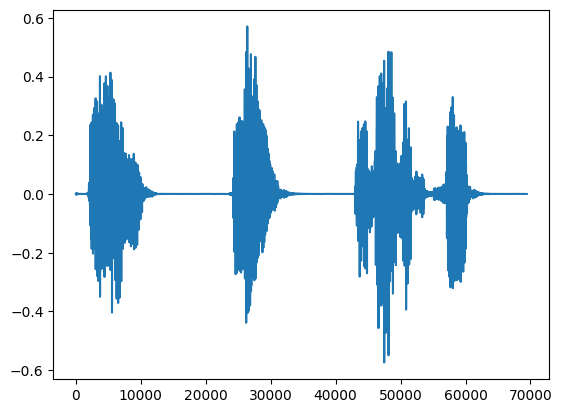

In [3]:
from transformers import AutoProcessor, BarkModel
from IPython.display import Audio
import matplotlib.pyplot as plt
import IPython.display as ipd
import gc

processor = AutoProcessor.from_pretrained("suno/bark")
model = BarkModel.from_pretrained("suno/bark")

voice_preset = "v2/en_speaker_6"
inputs = processor("Hello, my dog is cute", voice_preset=voice_preset)

audio_array = model.generate(**inputs)
audio_array = audio_array.cpu().numpy().squeeze()
sample_rate = model.generation_config.sample_rate

def plot_and_hear(audio, sr):
    display(ipd.Audio(audio_array, rate=sr))
    plt.plot(audio_array)

plot_and_hear(audio_array, sample_rate)

torch.mps.empty_cache()
gc.collect()

<b>ÎÎÎÎÎÎÎÎÎÎÎÎÎ</b> "<font color='red'>The attention mask and the pad token id were not set.</font>" warning in the following cell is fine. No worries. <b>ÎÎÎÎÎÎÎÎÎÎÎÎÎ</b>

Library of voices is here:
https://suno-ai.notion.site/8b8e8749ed514b0cbf3f699013548683?v=bc67cff786b04b50b3ceb756fd05f68c

List of some known non-speech sounds:
    [laughter]
    [laughs]
    [sighs]
    [music]
    [gasps]
    [clears throat]
    — or ... for hesitations
    ♪ for song lyrics
    capitalization for emphasis of a word
    MAN/WOMAN: for bias towards speaker

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


seed ====>4334581004259286088
String being generated [sighs] [clears throat] For a long time I used to go to bed early!


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:30<00:00,  1.39s/it]


String being generated [sighs]  Sometimes.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:15<00:00,  1.30s/it]


String being generated [sighs]  when I had put out my candle!


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 16/16 [00:22<00:00,  1.40s/it]


String being generated [sighs]  my eyes would close so quickly that I had not even time to say I'm going to sleep?


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [00:33<00:00,  1.47s/it]


3246

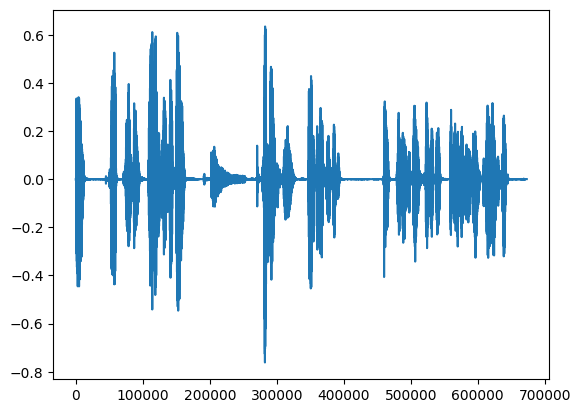

In [4]:
from transformers import AutoProcessor, BarkModel
from IPython.display import Audio
import matplotlib.pyplot as plt
import IPython.display as ipd
import gc, warnings

import os
os.environ["SUNO_ENABLE_MPS"] = "True"
os.environ["SUNO_USE_SMALL_MODELS"] = "False"
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"]="1"
os.environ["SUNO_OFFLOAD_CPU"] = "False"

import torch, re, random, torchaudio, sys
import numpy as np
from importlib import reload
from transformers import AutoProcessor, BarkModel
from bark import SAMPLE_RATE, generate_audio, text_to_semantic
from bark.generation import codec_decode, generate_coarse, generate_fine
from transformers import BertTokenizer
TEXT_ENCODING_OFFSET = 10_048
from scipy.io import wavfile
from bark.api import semantic_to_waveform
from bark.api import text_to_semantic
from typing import Optional, Union, Dict

original_load = torch.load
def patched_load(*args, **kwargs):
    kwargs['weights_only'] = False
    return original_load(*args, **kwargs)
torch.load = patched_load

if 'bark' in sys.modules:
    reload(sys.modules['bark'])
from bark import SAMPLE_RATE, generate_audio, preload_models
from IPython.display import Audio
preload_models()

warnings.filterwarnings("ignore")

def plot_and_hear(audio, sr):
    display(ipd.Audio(audio_array, rate=sr))
    plt.plot(audio_array)

def semantic_to_audio_tokens(
	semantic_tokens: np.ndarray,
	history_prompt: Optional[Union[Dict, str]] = None,
	temp: float = 0.7,
	silent: bool = False,
	output_full: bool = False,
):
	coarse_tokens = generate_coarse(
		semantic_tokens, history_prompt=history_prompt, temp=temp, silent=silent, use_kv_caching=True
	)
	fine_tokens = generate_fine(coarse_tokens, history_prompt=history_prompt, temp=0.5)

	if output_full:
		full_generation = {
			"semantic_prompt": semantic_tokens,
			"coarse_prompt": coarse_tokens,
			"fine_prompt": fine_tokens,
		}
		return full_generation
	return fine_tokens

model = BarkModel.from_pretrained("suno/bark").to(device)

style_prompt= "[sighs] "
end_prompt= "?.!"

seeed = random.randrange(18446744073709551615)
seeed = 4334581004259286088
print("seed ====>" + str(seeed))
torch.manual_seed(seeed)
torch.backends.cudnn.deterministic = True
history_prompt = "v2/en_speaker_3"

#"[clears throat] Is this the real life? Is this just fantasy?
#♪ In the jungle, the mighty jungle, the lion barks tonight ♪
#[laughs] Caught in a landslide, no escape from reality!"
#long_string = "[clears throat] Is this the real life? Is this just fantasy?"
#For a long time I used to go to bed early. Sometimes, when I had put out my candle, my eyes would close so quickly that I had not even time to say I'm going to sleep. And half an hour later the thought that it was time to go to sleep would awaken me.
long_string = "[clears throat] For a long time I used to go to bed early. Sometimes, when I had put out my candle, my eyes would close so quickly that I had not even time to say I'm going to sleep."
short_string = re.split('[?.!,]', long_string)

SString_nb = 0
audio_array = np.empty(shape=[0, 1])
audio_array_in = np.empty(shape=[0, 1])
for SString in short_string:
    if len(SString) == 0:
        continue
    if SString_nb != 0:
        SString = SString[1:]
        SString = SString[:1].upper() + SString[1:]

    SString = style_prompt + SString + random.choice(end_prompt)
    print("String being generated " + SString)

    semantic_tokens = text_to_semantic(text=SString, history_prompt=history_prompt, temp=0.7, silent=False)
    audio_tokens = semantic_to_audio_tokens(semantic_tokens, history_prompt=history_prompt, temp=0.7, silent=False, output_full=False)

    audio_array_in = codec_decode(audio_tokens)
    audio_array = np.append(audio_array, audio_array_in)

sample_rate = model.generation_config.sample_rate

audio_array = torch.tensor(audio_array.squeeze())
plot_and_hear(audio_array, sample_rate) 

torch.mps.empty_cache()
gc.collect()

<b>ÎÎÎÎÎÎÎÎÎÎÎÎÎ</b> "<font color='red'>The class optimum.bettertransformers.transformation.BetterTransformer` is deprecated.</font>" warning in the following cell is fine. No worries. <b>ÎÎÎÎÎÎÎÎÎÎÎÎÎ</b>

**Save file:**

In [5]:
from scipy.io import wavfile

wavfile.write("../mysound_" + str(seeed) + ".wav", rate=sample_rate, data=audio_array_in)

**Prompt games:**

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 31/31 [01:05<00:00,  2.10s/it]


3359

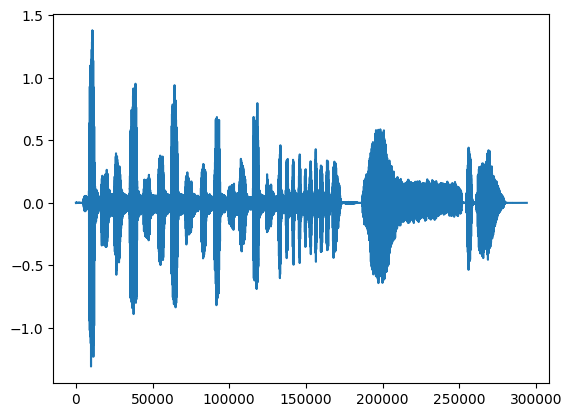

In [6]:
history_prompt = "v2/fr_speaker_7"

audio_array = np.empty(shape=[0, 1])
audio_array_in = np.empty(shape=[0, 1])

semantic_tokens = text_to_semantic(text="babibubebabibubebobabibubebobabibubebobabibubebobobabibubebo oooo tuti", history_prompt=history_prompt, temp=0.7, silent=False)
audio_tokens = semantic_to_audio_tokens(semantic_tokens, history_prompt=history_prompt, temp=0.7, silent=False, output_full=False)
audio_array_in = codec_decode(audio_tokens)
audio_array = np.append(audio_array, audio_array_in)

sample_rate = model.generation_config.sample_rate

audio_array = torch.tensor(audio_array.squeeze())
plot_and_hear(audio_array, sample_rate) 

torch.mps.empty_cache()
gc.collect()

**Semantic tokens games:**

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:11<00:00,  1.13s/it]


3053

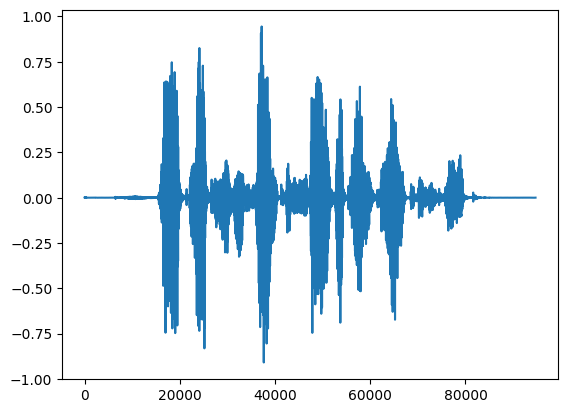

In [7]:
history_prompt = "v2/de_speaker_5"

use_semantic_history_prompt = False
use_coarse_history_prompt = False
use_fine_history_prompt = False
use_last_generation_as_history = False

audio_array = np.empty(shape=[0, 1])
audio_array_in = np.empty(shape=[0, 1])

semantic_tokens = text_to_semantic(text="I had not even time to say that I'm going to sleep?", history_prompt=history_prompt, temp=0.7, silent=False)

#np.random.shuffle(semantic_tokens)
#semantic_tokens = semantic_tokens[0:2]
#semantic_tokens = np.zeros(500)
#permutation
np.sort(semantic_tokens)

audio_tokens = semantic_to_audio_tokens(semantic_tokens, history_prompt=history_prompt, temp=0.7, silent=False, output_full=False)
audio_array_in = codec_decode(audio_tokens)
audio_array = np.append(audio_array, audio_array_in)

sample_rate = model.generation_config.sample_rate

audio_array = torch.tensor(audio_array.squeeze())
plot_and_hear(audio_array, sample_rate) 

torch.mps.empty_cache()
gc.collect()

**Audio tokens games:**

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:09<00:00,  1.08s/it]


3157

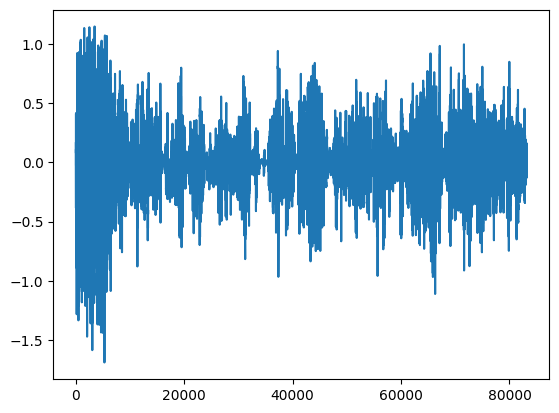

In [8]:
history_prompt = "v2/de_speaker_5"

use_semantic_history_prompt = False
use_coarse_history_prompt = False
use_fine_history_prompt = False
use_last_generation_as_history = False

audio_array = np.empty(shape=[0, 1])
audio_array_in = np.empty(shape=[0, 1])

semantic_tokens = text_to_semantic(text="I had not even time to say that I'm going to sleep?", history_prompt=history_prompt, temp=0.7, silent=False)
audio_tokens = semantic_to_audio_tokens(semantic_tokens, history_prompt=history_prompt, temp=0.7, silent=False, output_full=False)

np.random.shuffle(audio_tokens)
#audio_tokens = audio_tokens[0:2]
#audio_tokens = np.repeat(audio_tokens[0:2], 50)
#np.sort(audio_tokens)

audio_array_in = codec_decode(audio_tokens)
audio_array = np.append(audio_array, audio_array_in)

sample_rate = model.generation_config.sample_rate

audio_array = torch.tensor(audio_array.squeeze())
plot_and_hear(audio_array, sample_rate) 

torch.mps.empty_cache()
gc.collect()

**Determinism and seed:**

seed for generation 0 ====> 3913903275192262125


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:58<00:00,  1.96s/it]


seed for generation 1 ====> 4945378684570142055


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:11<00:00,  1.10s/it]


seed for generation 2 ====> 8147845581499273842


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:14<00:00,  1.20s/it]


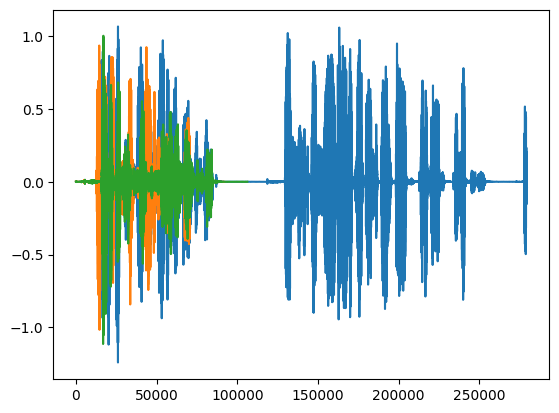

In [9]:
SString = "I had not even time to say that I'm going to sleep?"

torch.backends.cudnn.deterministic = True

for x in range(0, 3):

    seeed = random.randrange(18446744073709551615)
    print("seed for generation " + str(x) + " ====> " + str(seeed))
    torch.manual_seed(seeed)

    semantic_tokens = text_to_semantic(text=SString, history_prompt=history_prompt, temp=0.7, silent=False)
    audio_tokens = semantic_to_audio_tokens(semantic_tokens, history_prompt=history_prompt, temp=0.7, silent=False, output_full=False)

    audio_array = codec_decode(audio_tokens)
    audio_array_in = np.append(audio_array, audio_array_in)
    audio_array_in = audio_array_in.squeeze()
    sample_rate = model.generation_config.sample_rate

    encodec_output = torch.tensor(audio_array_in)
    plot_and_hear(encodec_output[None, :], sample_rate)

    torch.mps.empty_cache()
    gc.collect()

<b>ÎÎÎÎÎÎÎÎÎÎÎÎÎ</b> "<font color='red'>The class optimum.bettertransformers.transformation.BetterTransformer` is deprecated.</font>" warning in the following cell is fine. No worries. <b>ÎÎÎÎÎÎÎÎÎÎÎÎÎ</b>

**Temperature:**

<b>3 main parameters: temp, top_k, top_p.</b>
- For creative tasks, higher values of top-p and temperature encourage diversity, aiding creativity. A moderate top-k value can balance creativity and coherence.
- For deterministic output, low values of top-k (k = 1 or 2), a very low value of top-p (close to 0), and a low temperature close to 0 ensure the most probable and deterministic responses.

<b>1 extra parameter:</b>
min_eos_p=0.8, #kwargs["semantic_min_eos_p"] = 0.05 # 0.20 is default, lower means more likely to stotp

<u>In the file: <font color='red'>generation.py</font></u>

```python
def generate_text_semantic(
    temp=1.,

    top_k=None, #50
    top_p=None, #0.95
    
    top_k=200,
    top_p=100.3,
    silent=False,

    min_eos_p=1.,
    max_gen_duration_s=None,
    allow_early_stop=False,
    use_kv_caching=False,
):

**Temperature for semantic_tokens**

temperature for 1 ====> 0.001


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:42<00:00,  1.16s/it]


temperature for 2 ====> 0.851


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:16<00:00,  1.52s/it]


temperature for 3 ====> 1.7009999999999998


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:16<00:00,  1.10s/it]


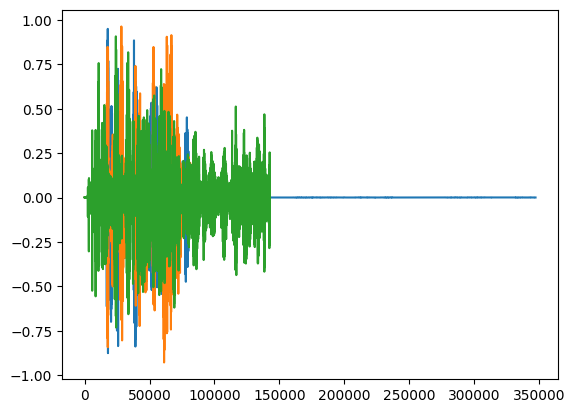

In [10]:
torch.manual_seed(16357271032164413994)

for x in range(0, 3):

    temp_init = 1.7
    temp = x/2 * temp_init + 0.001
    print("temperature for " + str(x+1) + " ====> " + str(temp))

    semantic_tokens = text_to_semantic(text=SString, history_prompt=history_prompt, temp=temp, silent=False)
    audio_tokens = semantic_to_audio_tokens(semantic_tokens, history_prompt=history_prompt, temp=0.7, silent=False, output_full=False)

    audio_array = codec_decode(audio_tokens)
    audio_array_in = np.append(audio_array, audio_array_in)
    audio_array_in = audio_array_in.squeeze()
    sample_rate = model.generation_config.sample_rate

    encodec_output = torch.tensor(audio_array_in)
    plot_and_hear(encodec_output[None, :], sample_rate)

    torch.mps.empty_cache()
    gc.collect()

**Temperature for audio_tokens**

temperature for 1 ====> 0.001


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:10<00:00,  1.06it/s]


temperature for 2 ====> 0.751


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:23<00:00,  1.21s/it]


temperature for 3 ====> 1.501


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:09<00:00,  1.05it/s]


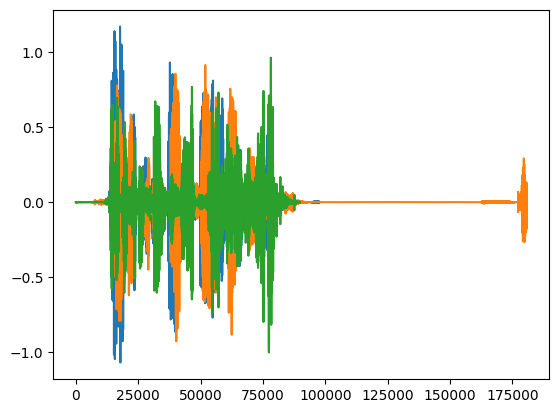

In [11]:
for x in range(0, 3):

    temp_init = 1.5
    temp = x/2 * temp_init + 0.001
    print("temperature for " + str(x+1) + " ====> " + str(temp))

    semantic_tokens = text_to_semantic(text=SString, history_prompt=history_prompt, temp=0.7, silent=False)
    audio_tokens = semantic_to_audio_tokens(semantic_tokens, history_prompt=history_prompt, temp=temp, silent=False, output_full=False)

    audio_array = codec_decode(audio_tokens)
    audio_array_in = np.append(audio_array, audio_array_in)
    audio_array_in = audio_array_in.squeeze()
    sample_rate = model.generation_config.sample_rate

    encodec_output = torch.tensor(audio_array_in)
    plot_and_hear(encodec_output[None, :], sample_rate)

    torch.mps.empty_cache()
    gc.collect()

**Deep fake**

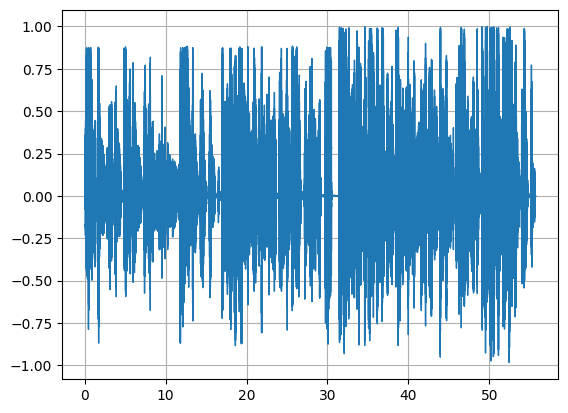

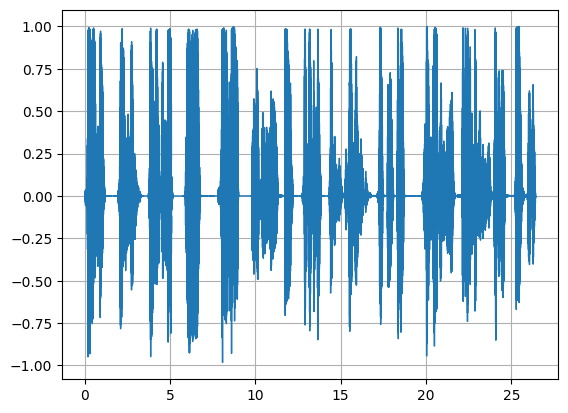

In [13]:
import soundfile
import torch

def plot_waveform(waveform, sample_rate):
    waveform = waveform.numpy()
    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sample_rate
    figure, axes = plt.subplots(num_channels, 1)
    if num_channels == 1:
        axes = [axes]
    for c in range(num_channels):
        axes[c].plot(time_axis, waveform[c], linewidth=1)
        axes[c].grid(True)
    display(ipd.Audio(waveform, rate=sample_rate))

waveform, sample_rate = torchaudio.load("../../female_hip_hop.wav")
plot_waveform(waveform, sample_rate)

waveform, sample_rate = torchaudio.load("../../male_hip_hop.wav")
plot_waveform(waveform, sample_rate)